In [1]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/final_merge.h5ad')
print(adata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(244687, 14073)


In [2]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)
adata.layers["counts"] = adata.X.copy()


In [3]:
min_genes = 100  # 최소 유전자 수
max_genes = 6000  # 최대 유전자 수
max_mt_pct = 10  # 미토콘드리아 비율 10% 이하
max_ribo_pct = 20  # 리보솜 비율 20% 이하
max_hb_pct = 5  # 헤모글로빈 비율 5% 이하

# 2. 품질 기준에 따라 불량한 셀 필터링
qc_pass = (
    (adata.obs['n_genes_by_counts'] >= min_genes) &
    (adata.obs['n_genes_by_counts'] <= max_genes) &
    (adata.obs['pct_counts_mt'] <= max_mt_pct) & 
    (adata.obs['pct_counts_ribo'] <= max_ribo_pct) &
    (adata.obs['pct_counts_hb'] <= max_hb_pct)
)
adata = adata[qc_pass].copy()

# 3. Scrublet을 사용하여 이중 세포 필터링
sc.pp.scrublet(adata, expected_doublet_rate=0.05)

# 4. 이중 세포 예측 결과 확인

# 5. 이중 세포 필터링 (예: predicted_doublets가 1인 세포는 제외)
doublet_cells = adata.obs['predicted_doublet'] == 1
adata = adata[~doublet_cells].copy()

print(f"이중 세포 필터링 후 데이터 크기: {adata.shape}")

이중 세포 필터링 후 데이터 크기: (98698, 14073)


In [4]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
import scanpy as sc

# 1. 품질 기준 설정
adata = adata[:, adata.var['highly_variable']].copy()
print(f"hvg 필터링 후 데이터 크기: {adata.shape}")

hvg 필터링 후 데이터 크기: (98698, 2126)


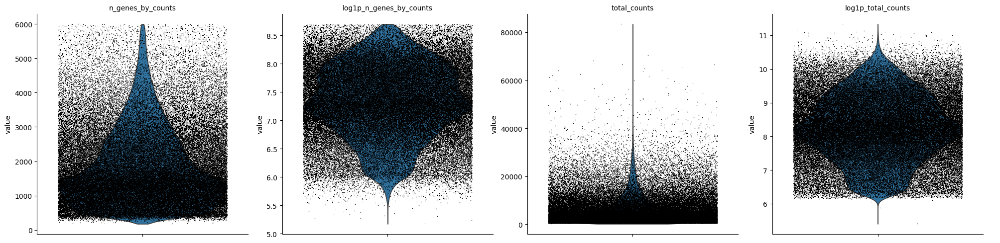

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts",'log1p_n_genes_by_counts', "total_counts",'log1p_total_counts'],
    jitter=0.4,
    multi_panel=True,
)

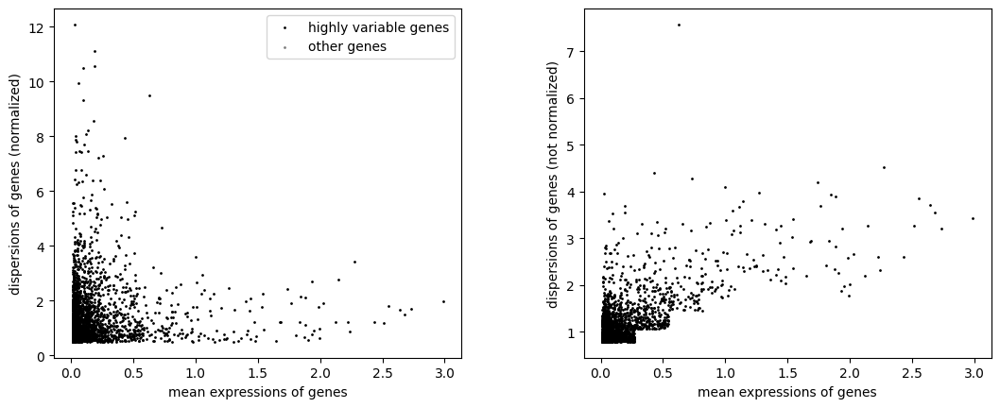

In [6]:
sc.pl.highly_variable_genes(adata)

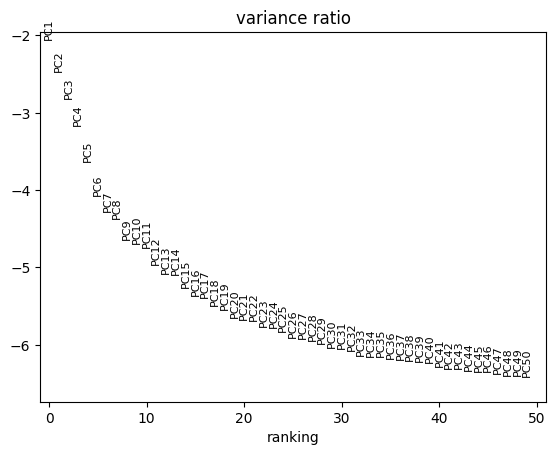

In [7]:
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

In [8]:
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.05)

/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-11-29 14:05:17.225519: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-29 14:05:17.238483: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-29 14:05:17.242474: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-29 14:05:17.252618: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow bi

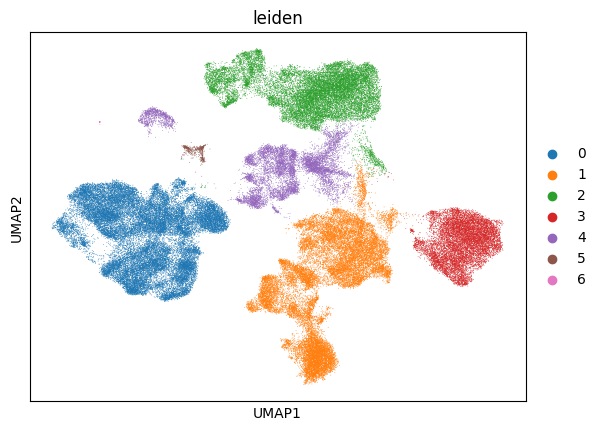

In [9]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=["leiden"])

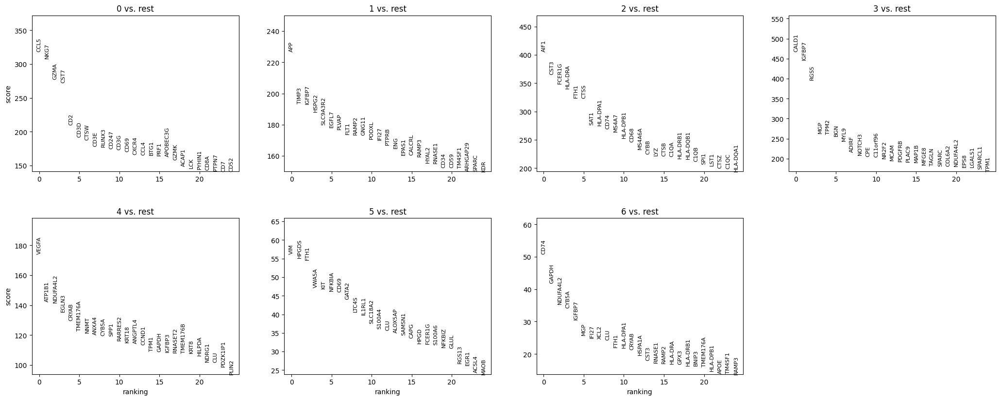

In [10]:
sc.tl.rank_genes_groups(adata, "leiden", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [11]:
import pandas as pd
pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(5)

,0,1,2,3,4,5,6
0,CCL5,APP,AIF1,CALD1,VEGFA,VIM,CD74
1,NKG7,TIMP3,CST3,IGFBP7,ATP1B1,HPGDS,GAPDH
2,GZMA,IGFBP7,FCER1G,RGS5,NDUFA4L2,FTH1,NDUFA4L2
3,CST7,HSPG2,HLA-DRA,MGP,EGLN3,VWA5A,CYB5A
4,CD2,SLC9A3R2,FTH1,TPM2,CRYAB,KIT,IGFBP7


In [12]:
result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
pd.DataFrame(
    {
        group + "_" + key[:1]: result[key][group]
        for group in groups
        for key in ["names", "pvals"]
    }
).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p
0,CCL5,0.0,APP,0.0,AIF1,0.0,CALD1,0.0,VEGFA,0.0,VIM,3.039146e-226,CD74,1.064993e-25
1,NKG7,0.0,TIMP3,0.0,CST3,0.0,IGFBP7,0.0,ATP1B1,0.0,HPGDS,1.252844e-217,GAPDH,2.347533e-23
2,GZMA,0.0,IGFBP7,0.0,FCER1G,0.0,RGS5,0.0,NDUFA4L2,0.0,FTH1,5.491476e-220,NDUFA4L2,1.187765e-21
3,CST7,0.0,HSPG2,0.0,HLA-DRA,0.0,MGP,0.0,EGLN3,0.0,VWA5A,1.332088e-188,CYB5A,2.611026e-21
4,CD2,0.0,SLC9A3R2,0.0,FTH1,0.0,TPM2,0.0,CRYAB,0.0,KIT,1.707777e-187,IGFBP7,1.832300e-20


In [13]:
# 확인할 유전자 리스트
genes_to_check = ["KRT18", "RGS5", "CD79A", "LYZ", "KIT"]

# 존재 여부 확인
present_genes = [gene for gene in genes_to_check if gene in adata.var_names]

# 결과 출력
print(f"존재하는 유전자: {present_genes}")
missing_genes = set(genes_to_check) - set(present_genes)
print(f"존재하지 않는 유전자: {missing_genes}")


존재하는 유전자: ['KRT18', 'RGS5', 'CD79A', 'LYZ', 'KIT']
존재하지 않는 유전자: set()


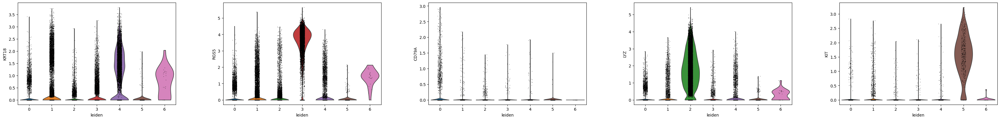

In [14]:
sc.pl.violin(adata, [ "KRT18","RGS5",  "CD79A", "LYZ", "KIT"], groupby="leiden")
#sc.pl.violin(adata, ["KRT18", "RGS5", "PECAM1", "CD3D", "CD79A", "LYZ", "KIT"], groupby="leiden")

In [15]:
# Epithelial (KRT18+), Mesangium (RGS5+), 
# Endothelial (PECAM1+), Lymphoid (CD3D+), B (CD79A+), Myeloid (LYZ+), Mast (KIT+)

In [16]:
# Epithelial (KRT18+), Mesangium (RGS5+), 
# Endothelial (PECAM1+), Lymphoid (CD3D+), B (CD79A+), Myeloid (LYZ+), Mast (KIT+)

In [17]:
#### annotation ######

In [18]:
import celltypist
from celltypist import models
models.download_models(force_update = True)
models.models_description()

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 52
📂 Storing models in /home/kykim/.celltypist/data/models
💾 Downloading model [1/52]: Immune_All_Low.pkl
💾 Downloading model [2/52]: Immune_All_High.pkl
💾 Downloading model [3/52]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/52]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/52]: Adult_Human_MTG.pkl
💾 Downloading model [6/52]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/52]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/52]: Adult_Human_Skin.pkl
💾 Downloading model [9/52]: Adult_Mouse_Gut.pkl
💾 Downloading model [10/52]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [11/52]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [12/52]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [13/52]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [14/52]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [15/52]: COVID19_Immune_Landsca

,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_COVID19_PBMC.pkl,peripheral blood mononuclear cell types from C...
3,Adult_CynomolgusMacaque_Hippocampus.pkl,cell types from the hippocampus of adult cynom...
4,Adult_Human_MTG.pkl,cell types and subtypes (10x-based) from the a...
5,Adult_Human_PancreaticIslet.pkl,cell types from pancreatic islets of healthy a...
6,Adult_Human_PrefrontalCortex.pkl,cell types and subtypes from the adult human d...
7,Adult_Human_Skin.pkl,cell types from human healthy adult skin
8,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...
9,Adult_Mouse_OlfactoryBulb.pkl,cell types from the olfactory bulb of adult mice


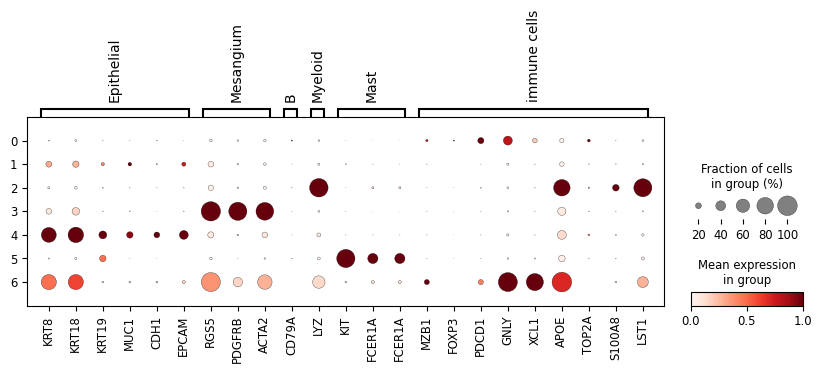

In [20]:
marker_genes = {
    "Epithelial": ["KRT8","KRT18","KRT19","MUC1","CDH1","EPCAM"],
    "Mesangium": ["RGS5","PDGFRB","ACTA2"],
    "B": ["CD79A"],
    "Myeloid": ["LYZ"],
    "Mast": ["KIT","FCER1A","FCER1A"],
    'immune cells' : [ 'MZB1', 'FOXP3', 'PDCD1', 'GNLY', 'XCL1', 'APOE', 'TOP2A',  'S100A8', 'LST1']
}

sc.pl.dotplot(adata, marker_genes, groupby="leiden", standard_scale="var")

In [21]:
marker_genes = {
    "Epithelial": ["KRT8","KRT18","KRT19","MUC1","CDH1","EPCAM"],
    "Mesangium": ["RGS5","PDGFRB","ACTA2"],
    "B": ["CD79A"],
    "Myeloid": ["LYZ"],
    "Mast": ["KIT","FCER1A","FCER1A"],
    }

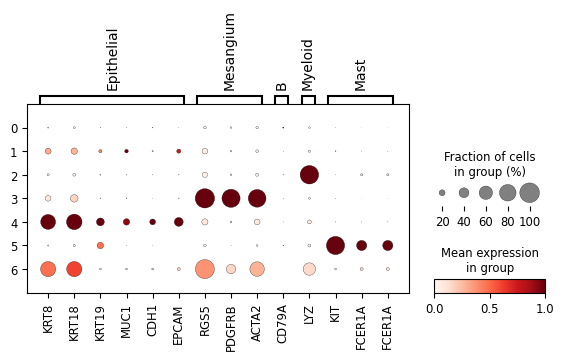

In [22]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden", standard_scale="var")

... storing 'cell_type' as categorical


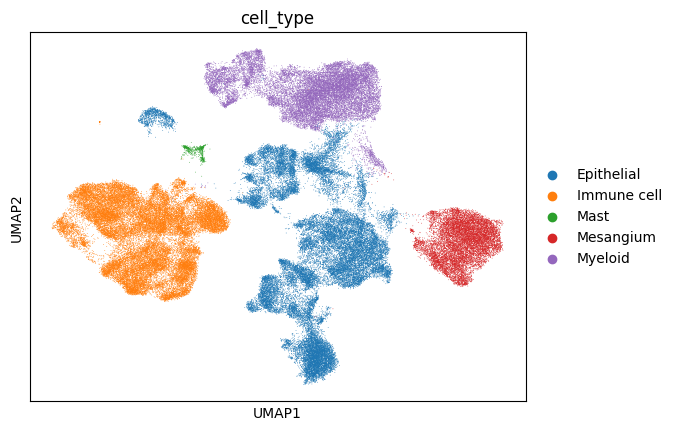

In [23]:
import scanpy as sc
import pandas as pd

def annotate_clusters(adata, cluster_col='leiden', annotation_map=None):
    """
    클러스터링된 adata 객체의 클러스터에 셀 타입을 주석하는 함수.

    Parameters:
    adata (AnnData): UMAP 및 클러스터링이 완료된 AnnData 객체.
    cluster_col (str): adata.obs에서 클러스터링 열 이름. 기본값은 'leiden'.
    annotation_map (dict): 클러스터 ID와 셀 타입 간 매핑 딕셔너리. 예: {'0': 'epithelial', '1': 'myeloid', ...}

    Returns:
    AnnData: 셀 타입이 adata.obs에 주석된 AnnData 객체.
    """
    if annotation_map is None:
        raise ValueError("annotation_map을 제공해야 합니다.")

    # 클러스터 ID를 셀 타입으로 매핑하여 새로운 열 추가
    adata.obs['cell_type'] = adata.obs[cluster_col].map(annotation_map)

    # 매핑이 안 된 클러스터가 있는지 확인
    unmapped_clusters = adata.obs[adata.obs['cell_type'].isnull()][cluster_col].unique()
    if len(unmapped_clusters) > 0:
        print(f"다음 클러스터 ID는 매핑되지 않았습니다: {unmapped_clusters}")

    return adata

# 예시 사용법
annotation_map = { 
    '0': 'Immune cell', 
    '1': 'Epithelial', 
    '2': 'Myeloid', 
    '3': 'Mesangium', 
    '4': 'Epithelial', 
    '5': 'Mast', 
    '6': 'Immune cell' 
}

# 클러스터링된 adata 객체에 셀 타입을 주석
adata = annotate_clusters(adata, cluster_col='leiden', annotation_map=annotation_map)

# UMAP 시각화 시 셀 타입 표시
sc.pl.umap(adata, color='cell_type')


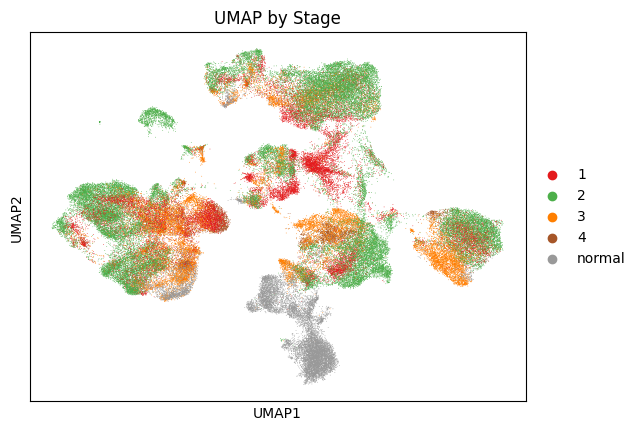

In [24]:
import scanpy as sc
import matplotlib.pyplot as plt

# UMAP 차원 축소 수행 (이미 UMAP을 수행한 경우 이 부분은 생략 가능)
# sc.pp.neighbors(adata)  # 이미 이 단계를 마쳤다면 주석 처리
# sc.tl.umap(adata)

# UMAP 시각화
sc.pl.umap(adata, color='stage', title='UMAP by Stage', palette='Set1')

# 결과 표시
plt.show()


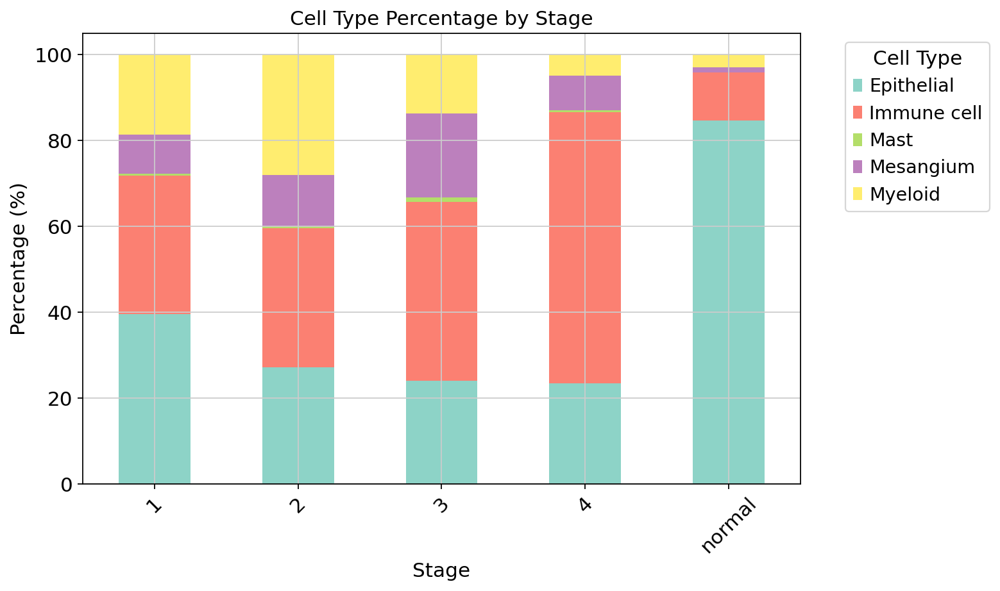

+--------+--------------------+--------------------+---------------------+--------------------+--------------------+
| stage  |     Epithelial     |    Immune cell     |        Mast         |     Mesangium      |      Myeloid       |
+--------+--------------------+--------------------+---------------------+--------------------+--------------------+
|   1    | 39.480559397571845 | 32.27293683725219  | 0.4507965780441576  |  9.25157522667896  | 18.544131960452845 |
|   2    | 27.145057117245504 | 32.399384007171264 | 0.49877031282322387 | 11.988875353391409 | 27.967913209368607 |
|   3    | 24.047884187082406 | 41.575723830734965 | 1.0634743875278396  | 19.682628062360802 | 13.630289532293988 |
|   4    | 23.47979599843076  | 63.20125539427226  | 0.3138485680659082  | 8.061985092193016  | 4.943114947038054  |
| normal | 84.70504281636536  | 11.108468125594671 |         0.0         | 1.3162067871868062 | 2.8702822708531555 |
+--------+--------------------+--------------------+------------

In [90]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# stage와 cell type 정보가 포함된 데이터에서 퍼센티지 계산
# 'cell_type'과 'stage'는 adata.obs에 존재한다고 가정

# 셀 타입과 stage별 셀 수 계산
cell_type_stage_counts = adata.obs.groupby(['stage', 'cell_type']).size().unstack(fill_value=0)

# 각 stage별 셀 타입의 퍼센티지 계산
cell_type_stage_percentages = cell_type_stage_counts.div(cell_type_stage_counts.sum(axis=1), axis=0) * 100

# 퍼센티지 시각화 (bar plot)
ax = cell_type_stage_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Set3')

# 그래프 제목 및 레이블 설정
plt.title('Cell Type Percentage by Stage')
plt.xlabel('Stage')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45)
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# 결과 표시
plt.tight_layout()
plt.show()

from tabulate import tabulate

# tabulate를 사용해 표 형태로 출력
table = tabulate(
    cell_type_stage_percentages.reset_index(),
    headers="keys",
    tablefmt="pretty",
    showindex=False
)

# 표 출력
print(table)



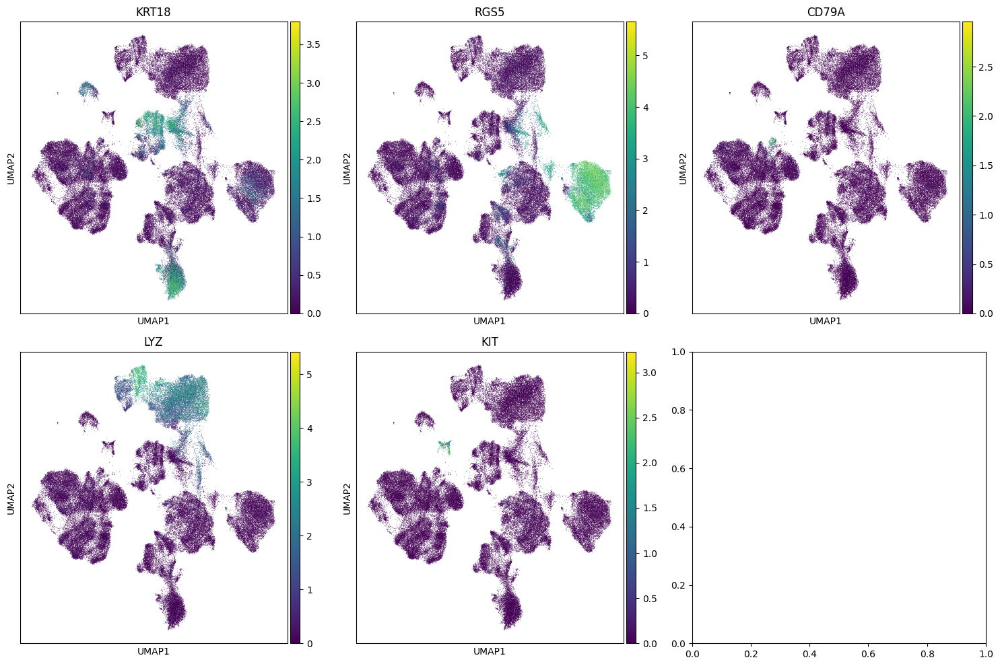

In [26]:
import scanpy as sc
import matplotlib.pyplot as plt

# 각 유전자에 대해 UMAP을 개별적으로 시각화
genes = ['KRT18', 'RGS5', 'CD79A', 'LYZ', 'KIT']

# 6개의 UMAP을 한 번에 표시
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, gene in enumerate(genes):
    ax = axes[i // 3, i % 3]  # 2x3 배열의 적절한 위치에 배치
    sc.pl.umap(adata, color=gene, ax=ax, show=False, title=gene, cmap='viridis')

plt.tight_layout()
plt.show()


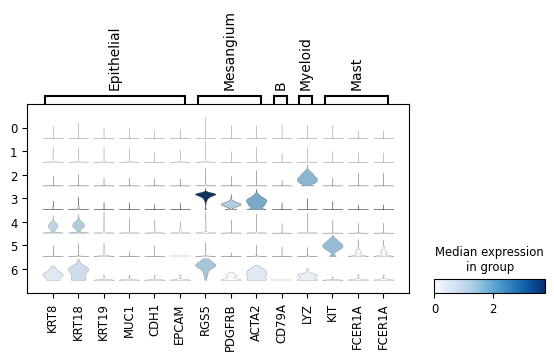

In [27]:
sc.pl.stacked_violin(adata, marker_genes, groupby="leiden");

In [28]:
adata.write('/home/Data_Drive_8TB_3/kykim/ccRCC/final_merge_preprocess.h5ad')

In [29]:
epithelial_cells = adata.obs['cell_type'].isin(['Epithelial'])
Eadata = adata[epithelial_cells].copy()
# 확인: 미토콘드리아 유전자들의 발현 값이 모두 0인지 확인
print("Mitochondrial genes:", Eadata.shape)

Mitochondrial genes: (35716, 2126)


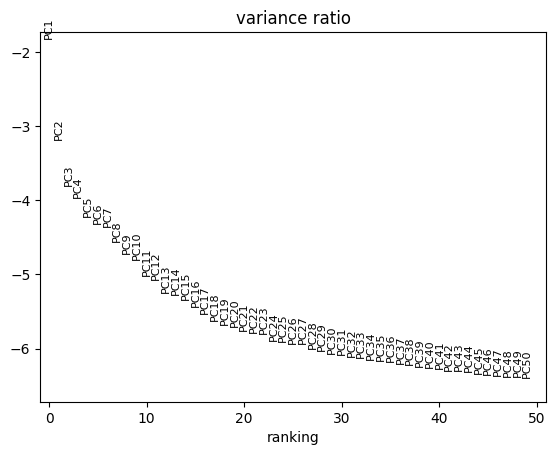

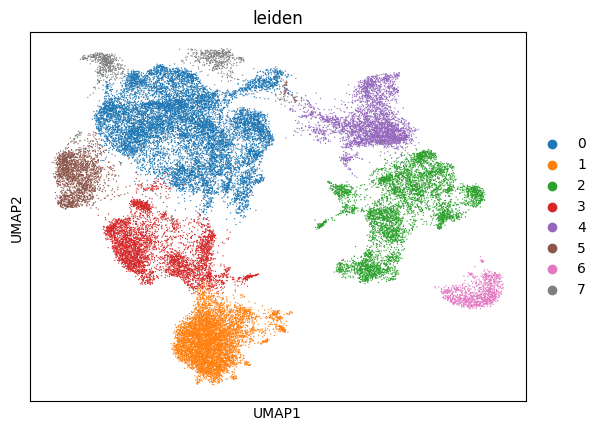

In [30]:
sc.pp.neighbors(Eadata)
sc.tl.leiden(Eadata, resolution=0.15)
sc.tl.pca(Eadata)
sc.pl.pca_variance_ratio(Eadata, n_pcs=50, log=True)
sc.pp.neighbors(Eadata)
sc.tl.leiden(Eadata, resolution=0.15)
sc.tl.umap(Eadata)
sc.pl.umap(Eadata, color=["leiden"])

In [31]:
Eadata.write('/home/Data_Drive_8TB_3/kykim/ccRCC/Epithelial_adata.h5ad')


In [32]:
#infer CNV#

In [33]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
sc.settings.set_figure_params(figsize=(5, 5))
sc.logging.print_header()

scanpy==1.10.3 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.14.1 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.4 igraph==0.11.6 louvain==0.8.2 pynndescent==0.5.13


In [34]:
import pandas as pd

# GTF 파일 로드 (필요한 경우 경로 수정)
gtf_file = "/home/kykim/Homo_sapiens.GRCh38.110.gtf"
gtf = pd.read_csv(gtf_file, sep="\t", comment="#", header=None)
gtf.columns = ["chromosome", "source", "feature", "start", "end", "score", "strand", "frame", "attributes"]

gene_mapping = gtf[gtf["feature"] == "gene"][["attributes"]]

# 'attributes'에서 gene_id와 gene_name 추출
gene_mapping["gene_id"] = gene_mapping["attributes"].str.extract(r'gene_id "([^"]+)"')[0]
gene_mapping["gene_name"] = gene_mapping["attributes"].str.extract(r'gene_name "([^"]+)"')[0]

# 필요한 데이터프레임 생성
gene_mapping = gene_mapping[["gene_id", "gene_name"]]
gene_mapping.set_index("gene_name", inplace=True)
# 중복 제거: 중복된 gene_name은 첫 번째 값만 남김
gene_mapping = gene_mapping[~gene_mapping.index.duplicated(keep="first")]

# `Eadata.var_names`를 기준으로 Ensembl ID 매핑
# Eadata.var_names는 gene_name이라고 가정
Eadata.var["Ensemble_ID"] = Eadata.var_names.map(gene_mapping["gene_id"])

# 결과 확인
print(Eadata.var[["Ensemble_ID"]].head())

/tmp/ipykernel_3478758/1276400479.py:5: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  gtf = pd.read_csv(gtf_file, sep="\t", comment="#", header=None)


              Ensemble_ID
SAMD11    ENSG00000187634
ISG15     ENSG00000187608
AGRN      ENSG00000188157
TNFRSF18  ENSG00000186891
TNFRSF4   ENSG00000186827


In [35]:
gene_chromosome_map = gtf[gtf["feature"] == "gene"][["chromosome", "start", "end", "attributes"]]

# 'attributes'에서 유전자 ID 추출 (GENE_ID 형태가 다를 수 있으므로 확인 필요)
gene_chromosome_map["gene_id"] = gene_chromosome_map["attributes"].str.extract(r'gene_id "([^"]+)"')

# 원하는 컬럼만 추출하여 업데이트
gene_chromosome_map = gene_chromosome_map[["gene_id", "chromosome", "start", "end"]]

# 유전자 ID를 인덱스로 설정
gene_chromosome_map.set_index("gene_id", inplace=True)

# 결과 확인
print(gene_chromosome_map.head())

                chromosome    start      end
gene_id                                     
ENSG00000279928          1   182696   184174
ENSG00000228037          1  2581560  2584533
ENSG00000142611          1  3069168  3438621
ENSG00000284616          1  5301928  5307394
ENSG00000157911          1  2403964  2413797


In [36]:
# Ensemble_ID를 기준으로 gene_chromosome_map의 정보를 Eadata.var에 매핑
Eadata.var["chromosome"] = Eadata.var["Ensemble_ID"].map(gene_chromosome_map["chromosome"])
Eadata.var["start"] = Eadata.var["Ensemble_ID"].map(gene_chromosome_map["start"])
Eadata.var["end"] = Eadata.var["Ensemble_ID"].map(gene_chromosome_map["end"])

# 결과 확인
print(Eadata.var[["Ensemble_ID", "chromosome", "start", "end"]].head())


              Ensemble_ID chromosome      start        end
SAMD11    ENSG00000187634          1   923923.0   944575.0
ISG15     ENSG00000187608          1  1001138.0  1014540.0
AGRN      ENSG00000188157          1  1020120.0  1056118.0
TNFRSF18  ENSG00000186891          1  1203508.0  1206592.0
TNFRSF4   ENSG00000186827          1  1211326.0  1214153.0


In [37]:
# 정수형 염색체 정보를 문자열로 변환
Eadata.var['chromosome'] = Eadata.var['chromosome'].astype(str)

# 문자열 형식으로 염색체 이름에 'chr' 접두사 추가
Eadata.var['chromosome'] = Eadata.var['chromosome'].apply(lambda x: f"chr{x}" if not x.startswith("chr") else x)


In [38]:
import numpy as np

# adata.var_names에서 고유값 추출
unique_var_names = np.unique(Eadata.var_names)

# CNV 분석 함수에 전달
cnv.tl.infercnv(
    Eadata,
    reference_key="stage",  # 적합한 reference_key를 사용
    reference_cat=["normal"],  # 적합한 참조 세포군 설정
    window_size=250,
)


100%|██████████| 8/8 [00:04<00:00,  1.66it/s]


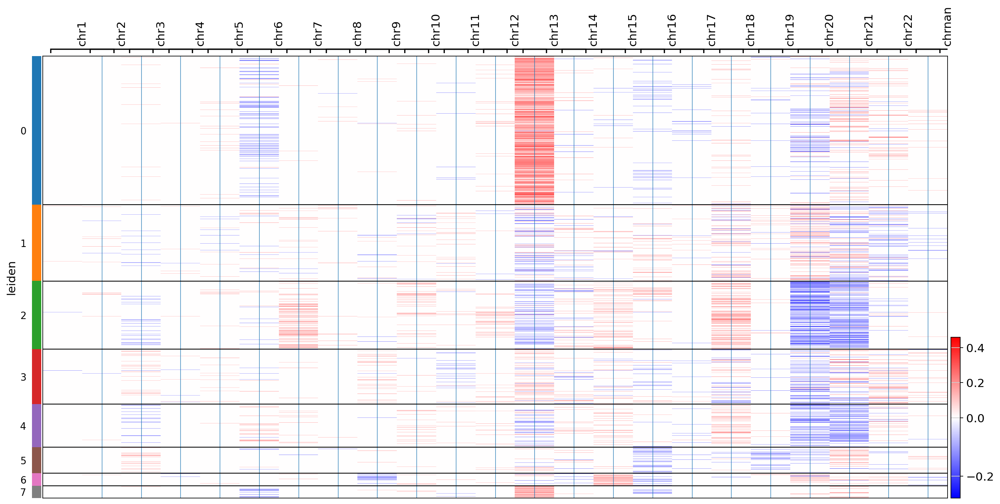

In [39]:
cnv.pl.chromosome_heatmap(
    Eadata, 
    groupby="leiden", 
    figsize=(20, 10)  # 가로 20, 세로 10 크기 설정
)


In [40]:
from tabulate import tabulate

# leiden 값별로 stage 값의 개수를 가로로 붙여서 출력
stage_counts_pivot = Eadata.obs.groupby('leiden')['stage'].value_counts().unstack(fill_value=0)

# tabulate로 출력 (프레임 추가)
print(tabulate(stage_counts_pivot, headers='keys', tablefmt='fancy_grid'))


╒══════════╤══════╤══════╤══════╤══════╤══════════╕
│   leiden │    1 │    2 │    3 │    4 │   normal │
╞══════════╪══════╪══════╪══════╪══════╪══════════╡
│        0 │ 1797 │ 6457 │ 2648 │ 1054 │       70 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        1 │    0 │   17 │    3 │    0 │     6133 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        2 │ 2289 │ 2230 │  820 │   70 │       97 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        3 │   21 │   81 │   35 │    9 │     4299 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        4 │ 3101 │  306 │   71 │    6 │        1 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        5 │  340 │  890 │  710 │   56 │       83 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        6 │    0 │ 1044 │    0 │    0 │        0 │
├──────────┼──────┼──────┼──────┼──────┼──────────┤
│        7 │  159 │  785 │   32 │    2 │        0 │
╘══════════╧══════╧══════╧══════╧══════╧══════════╛


In [41]:
import numpy as np

cnv.tl.pca(Eadata)
cnv.pp.neighbors(Eadata)
cnv.tl.leiden(Eadata)
cnv.tl.umap(Eadata)


... storing 'Ensemble_ID' as categorical
... storing 'chromosome' as categorical


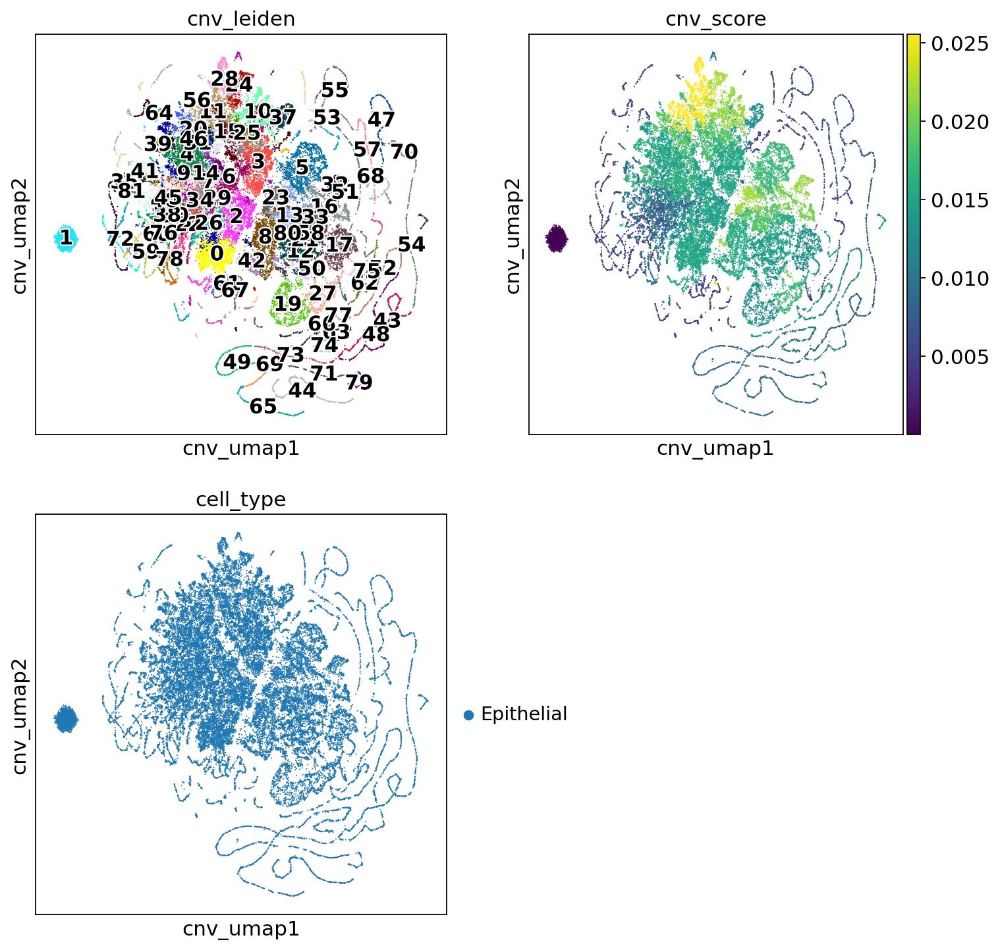

In [42]:
cnv.tl.cnv_score(Eadata)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    Eadata,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(Eadata, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(Eadata, color="cell_type", ax=ax3)

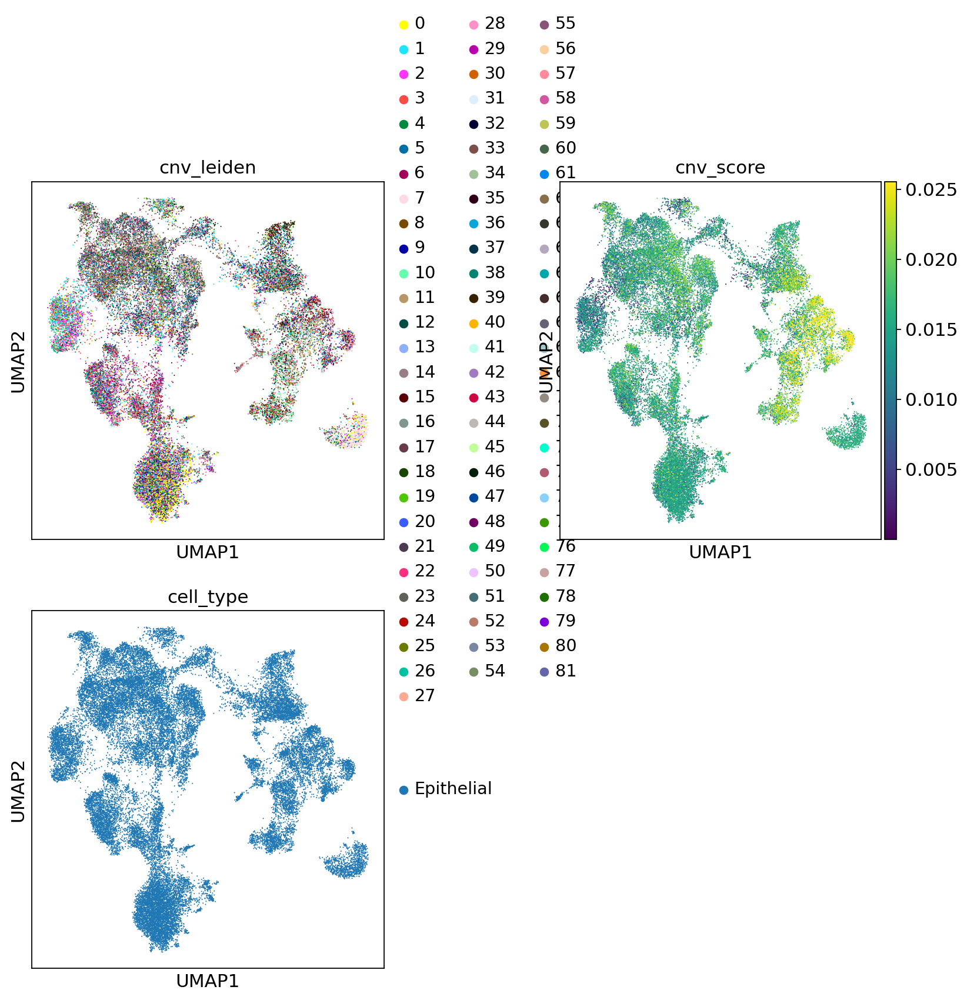

In [43]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(Eadata, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(Eadata, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(Eadata, color="cell_type", ax=ax3)

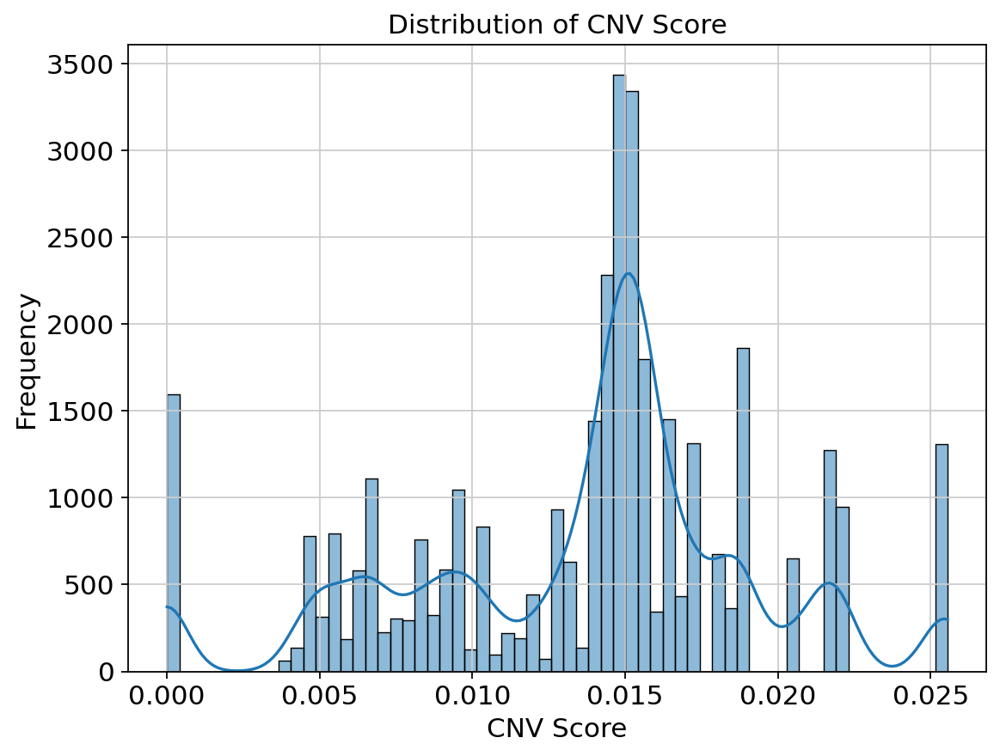

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# cnv_score의 분포 확인
plt.figure(figsize=(8, 6))
sns.histplot(Eadata.obs['cnv_score'], kde=True)
plt.title('Distribution of CNV Score')
plt.xlabel('CNV Score')
plt.ylabel('Frequency')
plt.show()


... storing 'leiden' as categorical
... storing 'cnv_status' as categorical


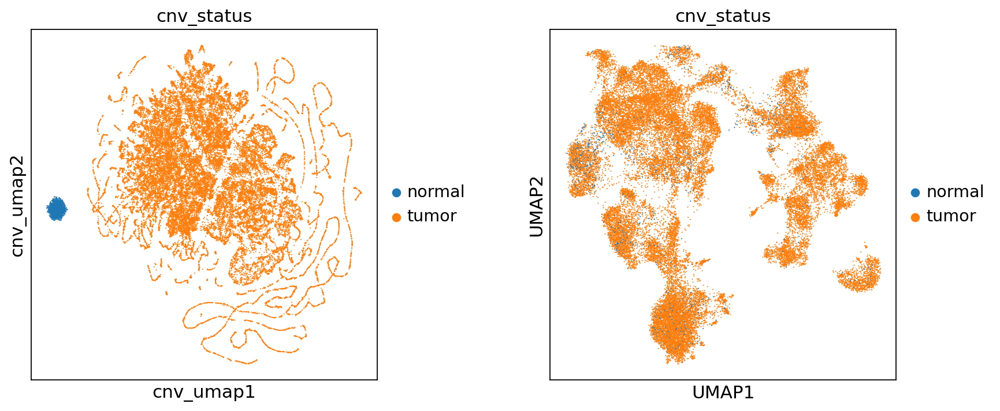

In [91]:
# cnv_leiden별 cnv_score의 평균 계산
grouped = Eadata.obs.groupby('cnv_leiden')['cnv_score'].mean()

# 평균이 0.02를 초과하는 cnv_leiden 클러스터 리스트
clusters_above_02 = grouped[grouped > 0.0025].index.tolist()

# 'normal'로 초기화
Eadata.obs["cnv_status"] = "normal"

# 평균이 0.02를 초과하는 클러스터들을 'tumor'로 설정
Eadata.obs.loc[Eadata.obs["cnv_leiden"].isin(clusters_above_02), "cnv_status"] = "tumor"


    
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={"wspace": 0.5})
cnv.pl.umap(Eadata, color="cnv_status", ax=ax1, show=False)
sc.pl.umap(Eadata, color="cnv_status", ax=ax2)

In [120]:
cnv_counts = Eadata.obs["cnv_status"].value_counts()

# 데이터프레임 형태로 변환 (필요 시)
cnv_counts_df = cnv_counts.reset_index()
cnv_counts_df.columns = ["Status", "Count"]

# tabulate를 사용해 출력
table = tabulate(cnv_counts_df, headers="keys", tablefmt="pretty", showindex=False)
print(table)

+--------+-------+
| Status | Count |
+--------+-------+
| tumor  | 34121 |
| normal | 1595  |
+--------+-------+


In [127]:
Eadata[Eadata.obs['cnv_status'] == 'tumor'].obs

,patient,stage,exp,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,doublet_score,predicted_doublet,leiden,cell_type,cnv_leiden,cnv_score,cnv_status,crg_score,hilpda_score,hypoxia_score
RCC81_AAACGAATCCCAACTC-1,RCC81,2,ccRCC,3222,8.078068,12779.0,9.455637,39.369278,47.022459,55.872917,...,0.101965,False,ccRCCccRCC0,Epithelial,17,0.013304,tumor,-0.193374,-0.537459,-0.328693
RCC81_AAAGGGCTCTTACGGA-1,RCC81,2,ccRCC,4985,8.514389,19808.0,9.893892,24.106422,31.557956,41.109653,...,0.036774,False,ccRCCccRCC0,Epithelial,17,0.013304,tumor,-0.181575,-0.504675,-0.255832
RCC81_AAAGGTAAGGTTACCT-1,RCC81,2,ccRCC,4613,8.436850,18193.0,9.808847,26.631122,34.722146,44.225801,...,0.036774,False,ccRCCccRCC0,Epithelial,48,0.011063,tumor,-0.195470,-0.453465,-0.304983
RCC81_AAAGTCCGTTTCTATC-1,RCC81,2,ccRCC,5176,8.551981,20994.0,9.952040,23.863961,31.651901,41.164142,...,0.143963,False,ccRCCccRCC0,Epithelial,44,0.009308,tumor,-0.168613,-0.449978,-0.328770
RCC81_AAATGGAAGTACGTCT-1,RCC81,2,ccRCC,5872,8.678121,28446.0,10.255798,22.874921,31.712719,41.773887,...,0.100710,False,ccRCCccRCC0,Epithelial,8,0.015677,tumor,-0.125243,-0.505931,-0.282493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM6415694_N2_TTTGGTTTCGAACCTA.1,N2,normal,GSM,364,5.899897,588.0,6.378426,39.795918,55.102041,72.108844,...,0.019076,False,ccRCCccRCC3,Epithelial,0,0.015372,tumor,0.082938,-0.367386,-0.180379
GSM6415694_N2_TTTGGTTTCGGTTCAA.1,N2,normal,GSM,1325,7.189922,2822.0,7.945555,30.970943,40.680369,52.445074,...,0.024504,False,ccRCCccRCC3,Epithelial,3,0.015402,tumor,-0.130794,-0.373634,-0.341002
GSM6415694_N2_TTTGGTTTCTAGTGTG.1,N2,normal,GSM,1631,7.397562,4049.0,8.306472,31.168190,42.603112,55.100025,...,0.048960,False,ccRCCccRCC3,Epithelial,29,0.010432,tumor,-0.121204,-0.365656,-0.274057
GSM6415694_N2_TTTGTTGGTACGGCAA.1,N2,normal,GSM,1116,7.018402,2107.0,7.653495,29.615567,39.867110,52.301851,...,0.016915,False,ccRCCccRCC3,Epithelial,6,0.014474,tumor,-0.142666,-0.290507,-0.272026


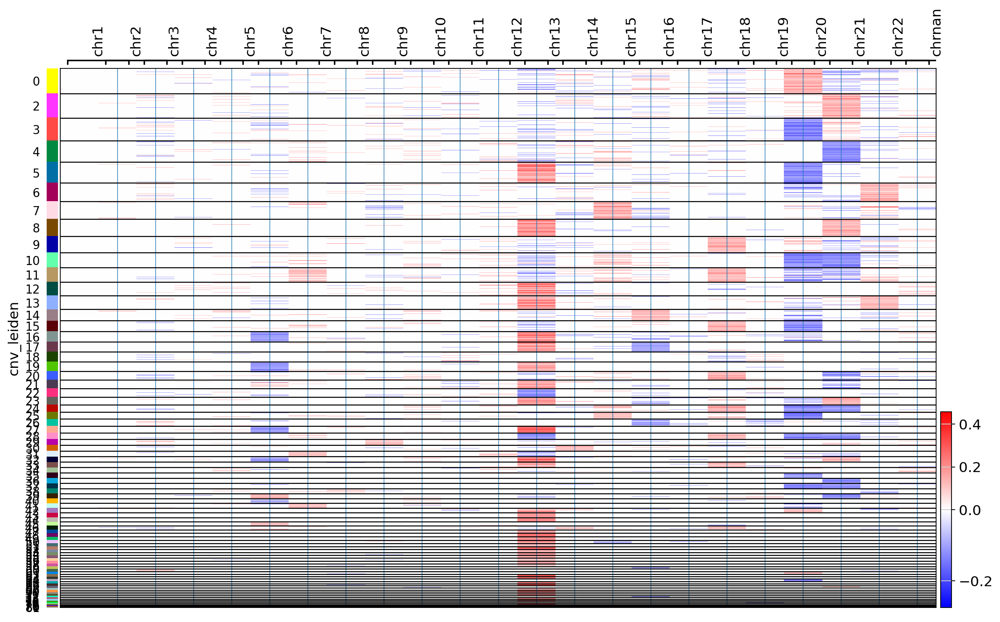

In [92]:
cnv.pl.chromosome_heatmap(Eadata[Eadata.obs["cnv_status"] == "tumor", :])

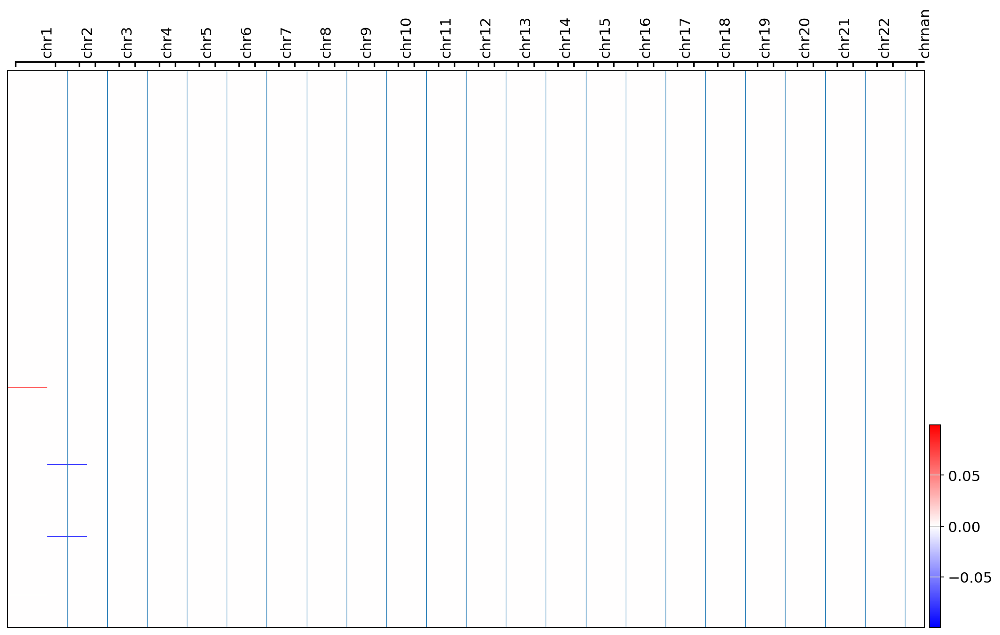

In [93]:
cnv.pl.chromosome_heatmap(Eadata[Eadata.obs["cnv_status"] == "normal", :])

Genes in Eadata.var_names: ['MT1G', 'PDK1', 'CP', 'MT1M', 'MT1X', 'SCO2', 'CCL8', 'MT1A', 'VEGFA', 'MT1E', 'PDE3B', 'HIST1H3A', 'MT1F']


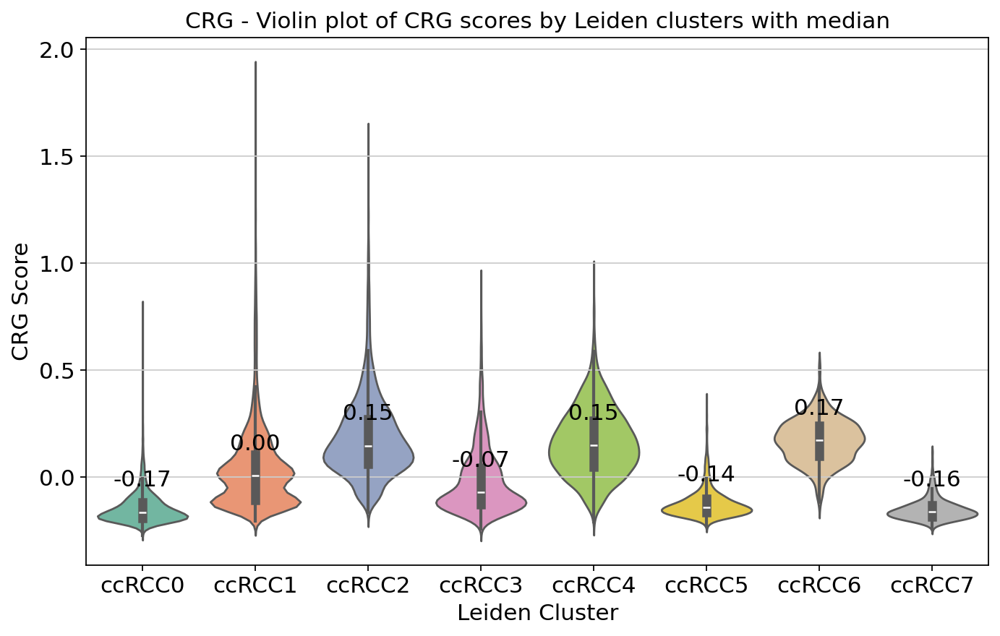

In [94]:
genes_to_check = ["AOC3", "COX11", "LIAS", "MT1G", "PDHB", "UBE2D1", "ATOX1", "COX17", "LIPT1", "MT1H", "PDK1", "UBE2D2", "ATP7A", "CP", "LOXL2", 
                  "MT1M", "SCO1", "UBE2D3", "ATP7B", "DBH", "MAP2K1", "MT1X", "SCO2", "UBE2D4", "CCL8", "DLAT", "MAP2K2", "MT-CO1", "SLC25A3", "ULK1",
                  "CCS", "DLD", "MT1A", "MT-CO2", "SLC31A1", "ULK2", "CD274", "FDX1", "MT1B", "MTF1", "SLC31A2", "VEGFA", "CDKN2A", "GLS", "MT1E", 
                  "PDE3B", "SOD1", "COA6", "HIST1H3A", "MT1F", "PDHA1", "TYR"]

# Eadata.var_names에 있는 유전자들만 필터링
value_gene = [gene for gene in genes_to_check if gene in Eadata.var_names]
print("Genes in Eadata.var_names:", value_gene)

# 점수를 특정 이름으로 저장 (예: 'crg_score')
sc.tl.score_genes(Eadata, value_gene, score_name='crg_score')

import seaborn as sns
import matplotlib.pyplot as plt

# 'leiden' 클러스터 별로 'crg_score' 값 시각화
plt.figure(figsize=(10, 6))
ax = sns.violinplot(x='leiden', y='crg_score', data=Eadata.obs, palette='Set2')

# 각 클러스터에 대해 median 계산 및 표시
median_values = Eadata.obs.groupby('leiden')['crg_score'].median()

for i, median in enumerate(median_values):
    ax.text(i, median + 0.1, f'{median:.2f}', color='black', ha='center', va='bottom')

# 제목과 축 레이블 추가
plt.title('CRG - Violin plot of CRG scores by Leiden clusters with median')
plt.xlabel('Leiden Cluster')
plt.ylabel('CRG Score')

plt.show()
#Genes in Eadata.var_names: ['AOC3', 'MT1G', 'CP', 'LOXL2', 'MT1M', 'MT1X', 'CCL8', 'MT1A', 'SLC31A2', 'CDKN2A', 'MT1E', 'MT1F']

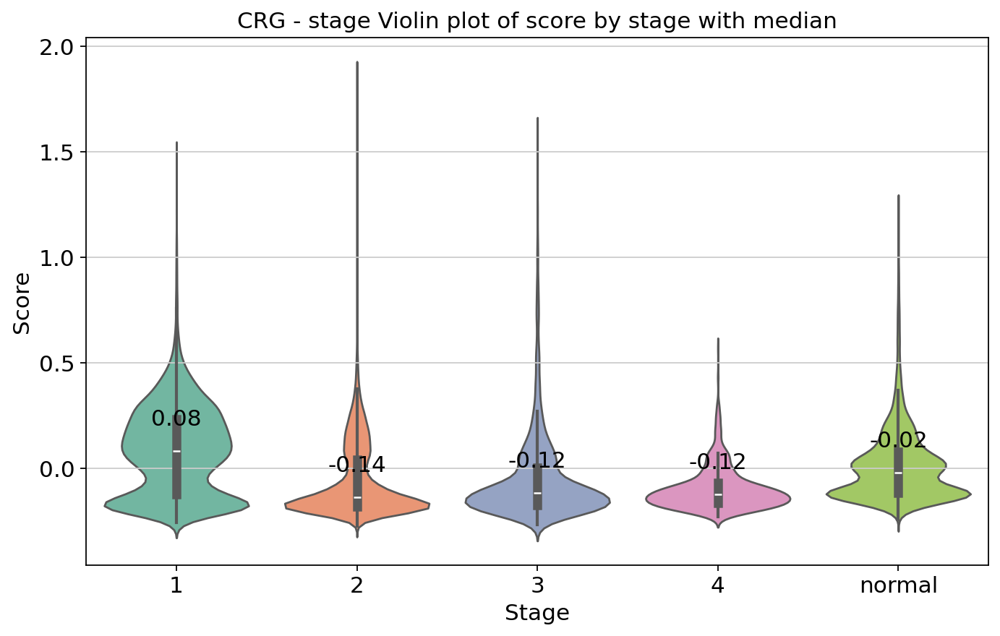

In [95]:
plt.figure(figsize=(10, 6))
ax = sns.violinplot(x='stage', y='crg_score', data=Eadata.obs, palette='Set2')

# 각 stage에 대해 median 계산 및 표시
median_values = Eadata.obs.groupby('stage')['crg_score'].median()

for i, median in enumerate(median_values):
    ax.text(i, median + 0.1, f'{median:.2f}', color='black', ha='center', va='bottom')

# 제목과 축 레이블 추가
plt.title('CRG - stage Violin plot of score by stage with median')
plt.xlabel('Stage')
plt.ylabel('Score')

plt.show()


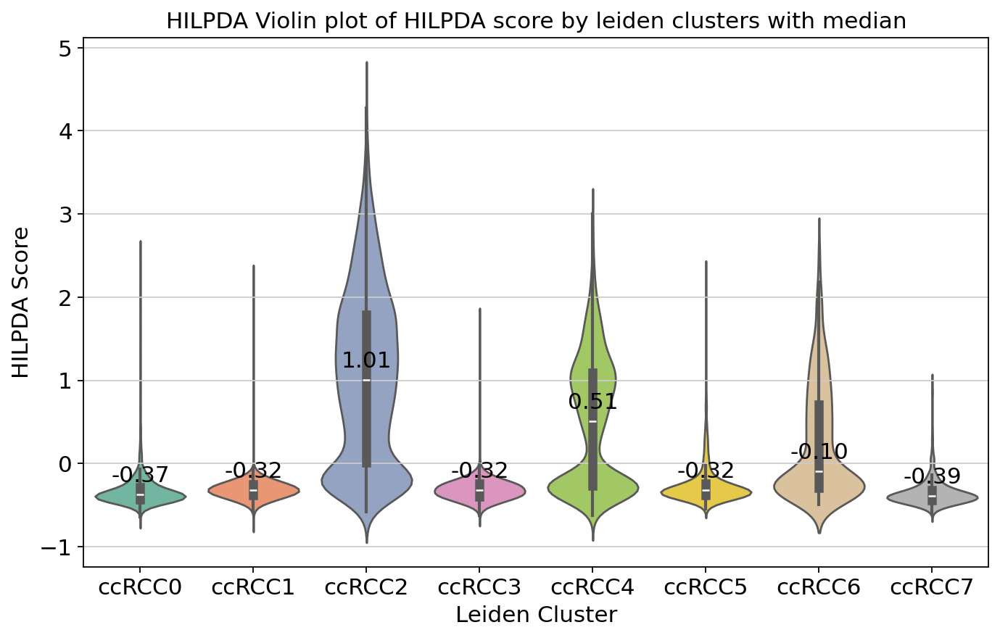

In [96]:
sc.tl.score_genes(Eadata, ['HILPDA'], score_name='hilpda_score')

plt.figure(figsize=(10, 6))
ax = sns.violinplot(x='leiden', y='hilpda_score', data=Eadata.obs, palette='Set2')

# 각 클러스터에 대해 median 계산 및 표시
median_values = Eadata.obs.groupby('leiden')['hilpda_score'].median()

for i, median in enumerate(median_values):
    ax.text(i, median + 0.1, f'{median:.2f}', color='black', ha='center', va='bottom')

# 제목과 축 레이블 추가
plt.title('HILPDA Violin plot of HILPDA score by leiden clusters with median')
plt.xlabel('Leiden Cluster')
plt.ylabel('HILPDA Score')

plt.show()

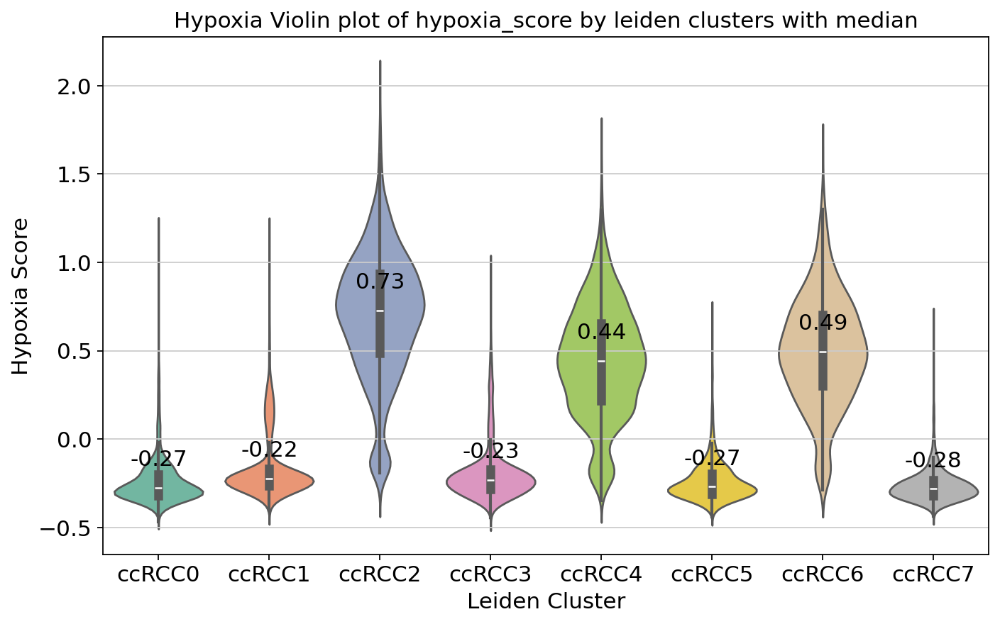

In [97]:
# Hypoxia marker genes 리스트
hypoxia_genes = ["HIF1A", "VEGFA", "LDHA", "EPO", "CA9", "SLC2A1", "PGK1", "BNIP3"]

# 유전자들이 var_names에 존재하는지 확인
hypoxia_genes = [gene for gene in hypoxia_genes if gene in Eadata.var_names]

# Hypoxia 관련 점수 계산 및 'hypoxia_score'로 저장
sc.tl.score_genes(Eadata, hypoxia_genes, score_name='hypoxia_score')

# Violin plot 생성
plt.figure(figsize=(10, 6))
ax = sns.violinplot(x='leiden', y='hypoxia_score', data=Eadata.obs, palette='Set2')

# 각 클러스터에 대해 median 계산 및 표시
median_values = Eadata.obs.groupby('leiden')['hypoxia_score'].median()

for i, median in enumerate(median_values):
    ax.text(i, median + 0.1, f'{median:.2f}', color='black', ha='center', va='bottom')

# 제목과 축 레이블 추가
plt.title('Hypoxia Violin plot of hypoxia_score by leiden clusters with median')
plt.xlabel('Leiden Cluster')
plt.ylabel('Hypoxia Score')

plt.show()


In [98]:
# immune cell #

In [99]:
# 확인할 유전자 리스트
genes_to_check = ["MS4A1", "MZB1", "ANXA1", "FOXP3", "PDCD1", "MIK67", "GNLY", "XCL1", 
                  "APOE", "TOP2A", "CLEC9A", "CELC10A", "CLEC4C", "S100A8", "LST1", "CPA3"]

# adata.var_names에 존재하는 유전자 필터링
genes_in_var = [gene for gene in genes_to_check if gene in adata.var_names]

print("Genes in adata.var_names:", genes_in_var)


Genes in adata.var_names: ['MZB1', 'FOXP3', 'PDCD1', 'GNLY', 'XCL1', 'APOE', 'TOP2A', 'S100A8', 'LST1']


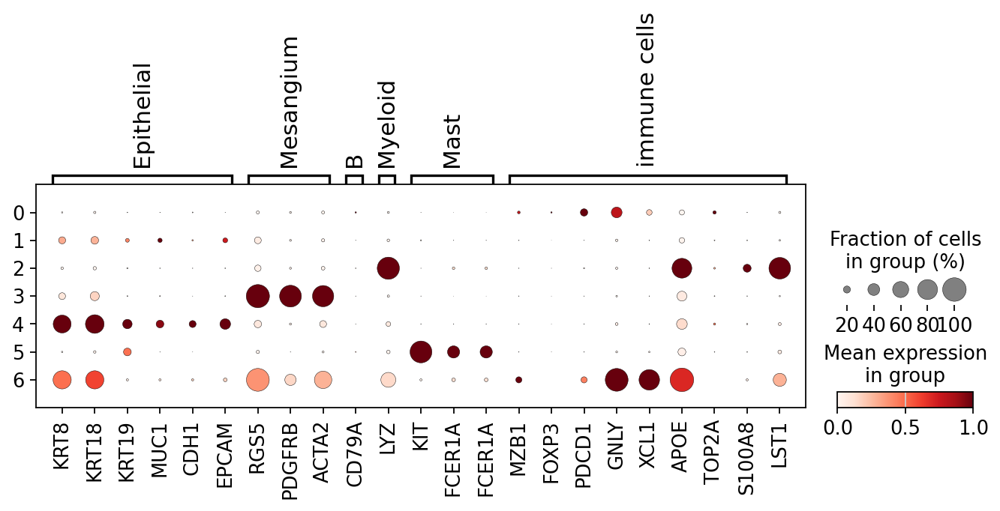

In [100]:
marker_genes = {
    "Epithelial": ["KRT8","KRT18","KRT19","MUC1","CDH1","EPCAM"],
    "Mesangium": ["RGS5","PDGFRB","ACTA2"],
    "B": ["CD79A"],
    "Myeloid": ["LYZ"],
    "Mast": ["KIT","FCER1A","FCER1A"],
    'immune cells' : [ 'MZB1', 'FOXP3', 'PDCD1', 'GNLY', 'XCL1', 'APOE', 'TOP2A', 'S100A8', 'LST1']
}

sc.pl.dotplot(adata, marker_genes, groupby="leiden", standard_scale="var")

In [101]:
# 필터 조건 설정
filter_condition = adata.obs["leiden"].isin(["0","2", "5","6"])

# 조건에 맞는 데이터로 새로운 AnnData 객체 생성
Iadata = adata[filter_condition].copy()

print(f"Iadata contains {Iadata.n_obs} observations and {Iadata.n_vars} variables.")
#Iadata contains 51529 observations and 2423 variables.

Iadata contains 51848 observations and 2126 variables.


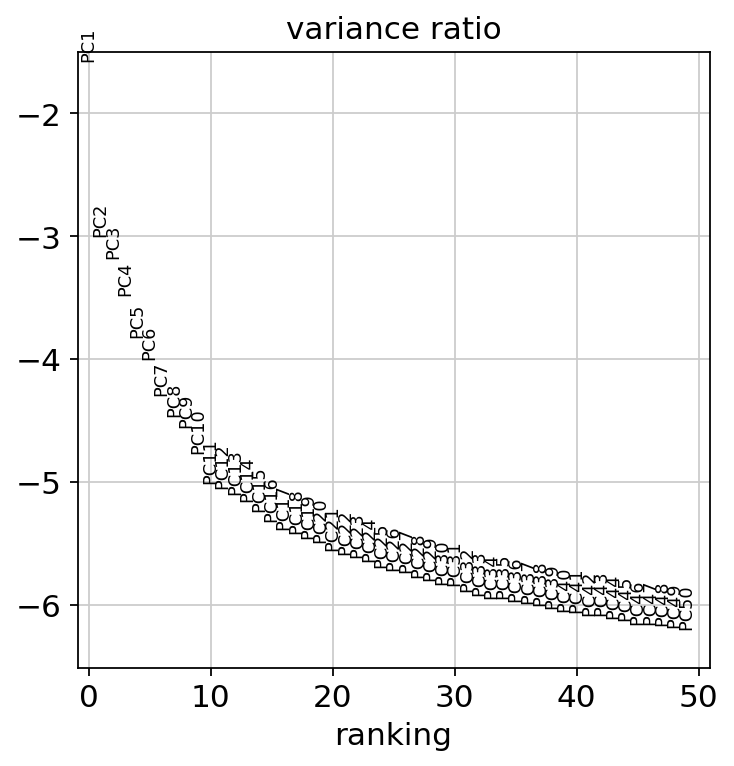

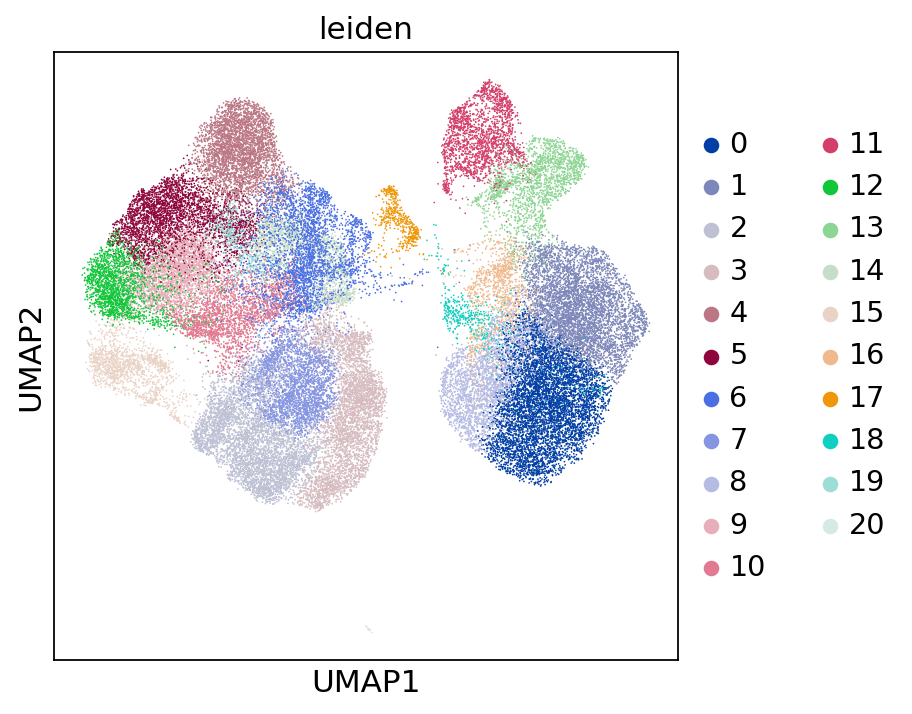

In [102]:
sc.tl.pca(Iadata, svd_solver='arpack')
sc.pl.pca_variance_ratio(Iadata, n_pcs=50, log=True)
sc.pp.neighbors(Iadata, n_pcs=15)
sc.tl.leiden(Iadata, resolution=1)
sc.tl.umap(Iadata)
sc.pl.umap(Iadata, color=["leiden"])

In [103]:
predictions = celltypist.annotate(Iadata, model = 'Immune_All_High.pkl', majority_voting = True)

⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 51848 cells and 2126 genes
🔗 Matching reference genes in the model
🧬 1344 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [104]:
Iadata = predictions.to_adata()

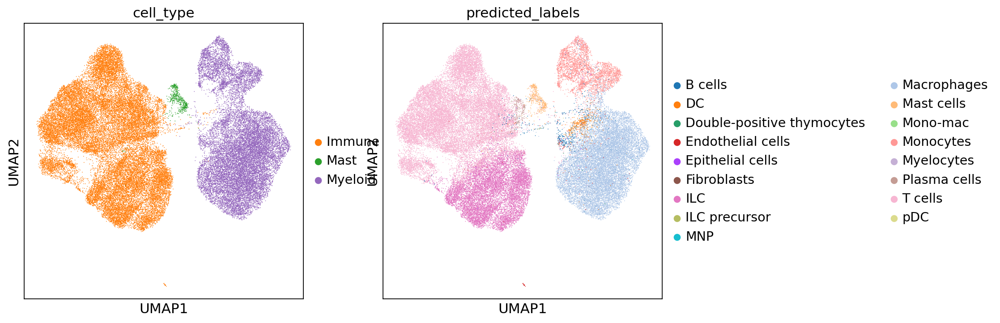

In [105]:
sc.pl.umap(Iadata, color = ['cell_type', 'predicted_labels'])

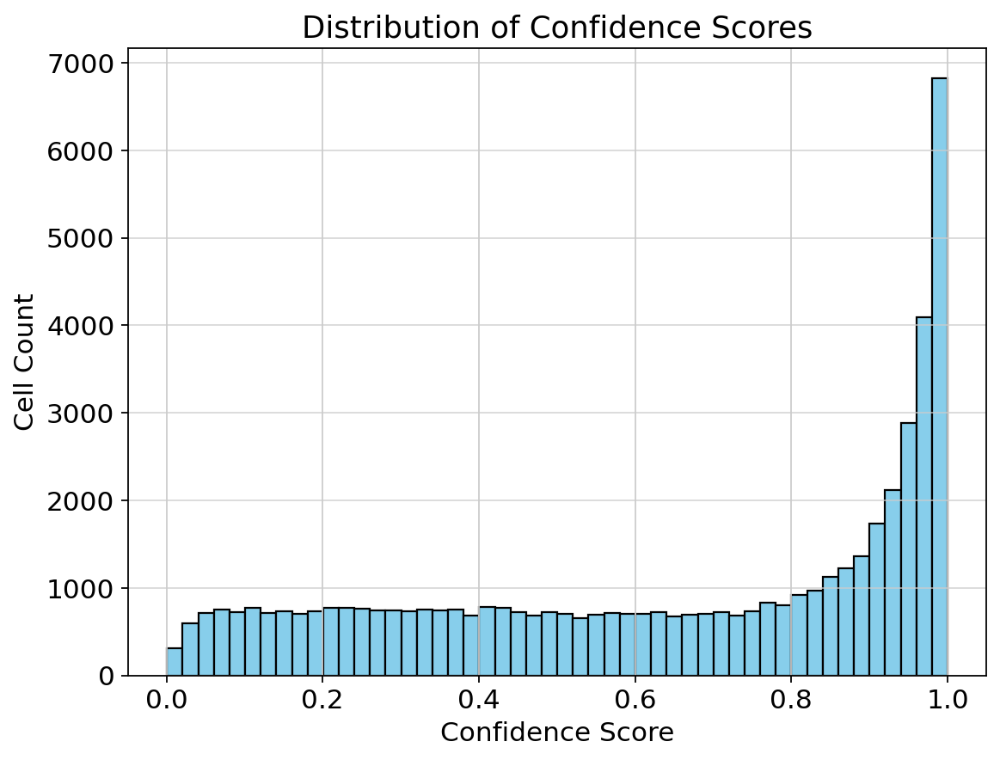

In [106]:
import matplotlib.pyplot as plt

# Check if 'conf_score' exists in Iadata.obs
if 'conf_score' in Iadata.obs:
    # Plot a histogram of conf_score
    plt.figure(figsize=(8, 6))
    Iadata.obs['conf_score'].hist(bins=50, color='skyblue', edgecolor='black')
    plt.title('Distribution of Confidence Scores', fontsize=16)
    plt.xlabel('Confidence Score', fontsize=14)
    plt.ylabel('Cell Count', fontsize=14)
    plt.grid(axis='y', alpha=0.75)
    plt.show()
else:
    print("The 'conf_score' column does not exist in Iadata.obs.")

In [1]:
# 'final_labels'을 Categorical로 변환
Iadata.obs['final_labels'] = Iadata.obs['predicted_labels'].astype('category')

# 이미 'No defined cell'이 카테고리에 포함되어 있는지 확인
if "No defined cell" not in Iadata.obs['final_labels'].cat.categories:
    Iadata.obs['final_labels'] = Iadata.obs['final_labels'].cat.add_categories("No defined cell")  # 새 카테고리 추가

# conf_score 0.5 미만인 경우 "No defined cell"로 설정
Iadata.obs.loc[Iadata.obs['conf_score'] < 0.80, 'final_labels'] = "No defined cell"

# 결과 확인
print(Iadata.obs['final_labels'].value_counts())


NameError: name 'adata' is not defined

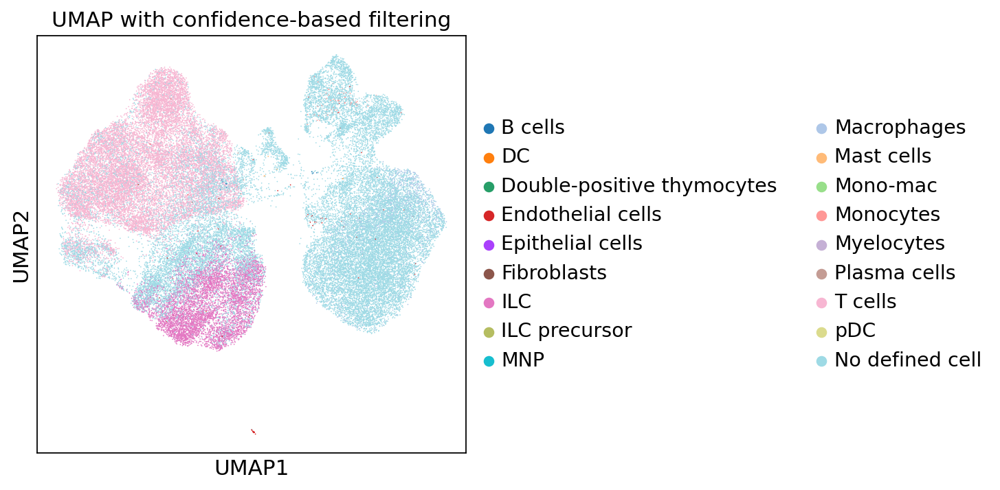

In [108]:
sc.pl.umap(Iadata, color='final_labels', title='UMAP with confidence-based filtering')


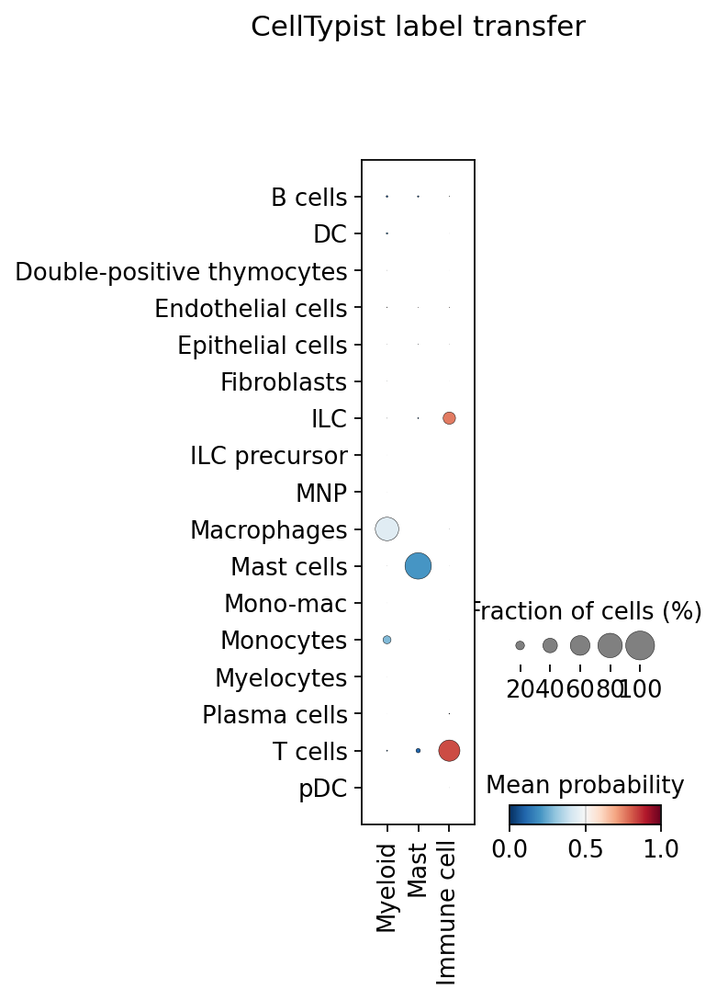

In [109]:
celltypist.dotplot(predictions, use_as_reference = 'cell_type', use_as_prediction = 'predicted_labels')

In [110]:
I0adata = Iadata[Iadata.obs['final_labels'] == 'No defined cell']

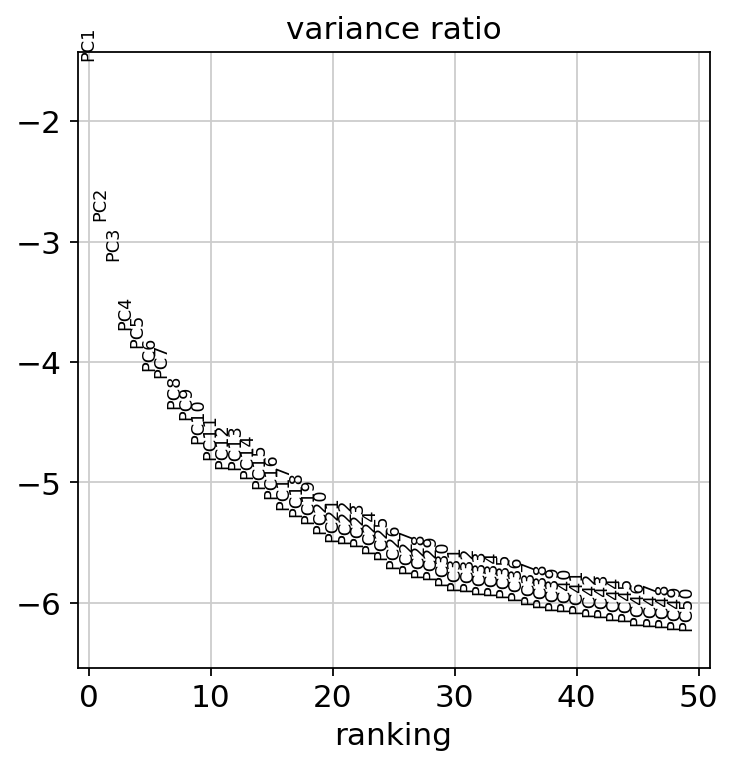

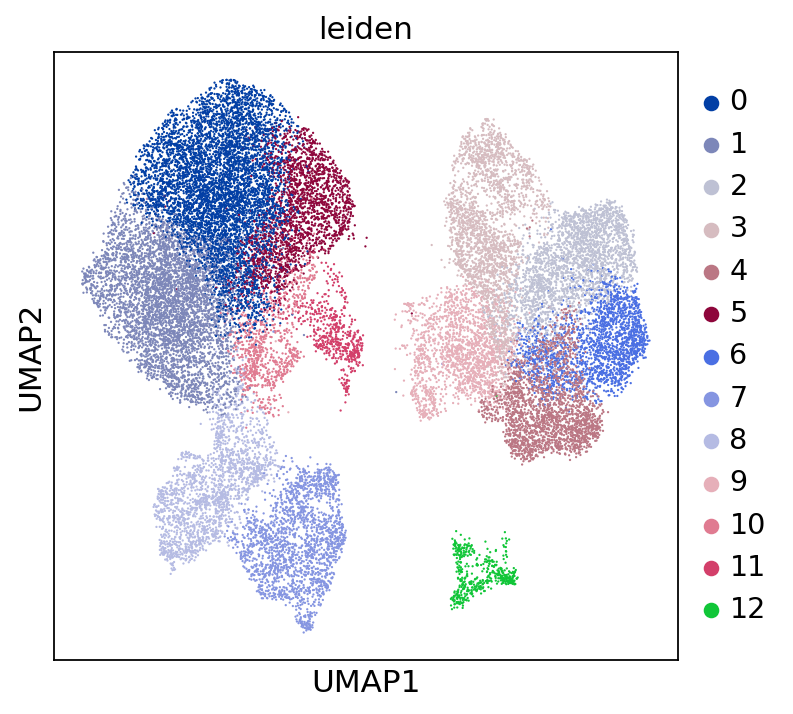

In [111]:
sc.tl.pca(I0adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(I0adata, n_pcs=50, log=True)
sc.pp.neighbors(I0adata, n_pcs=15)
sc.tl.leiden(I0adata, resolution=0.5)
sc.tl.umap(I0adata)
sc.pl.umap(I0adata, color=["leiden"])

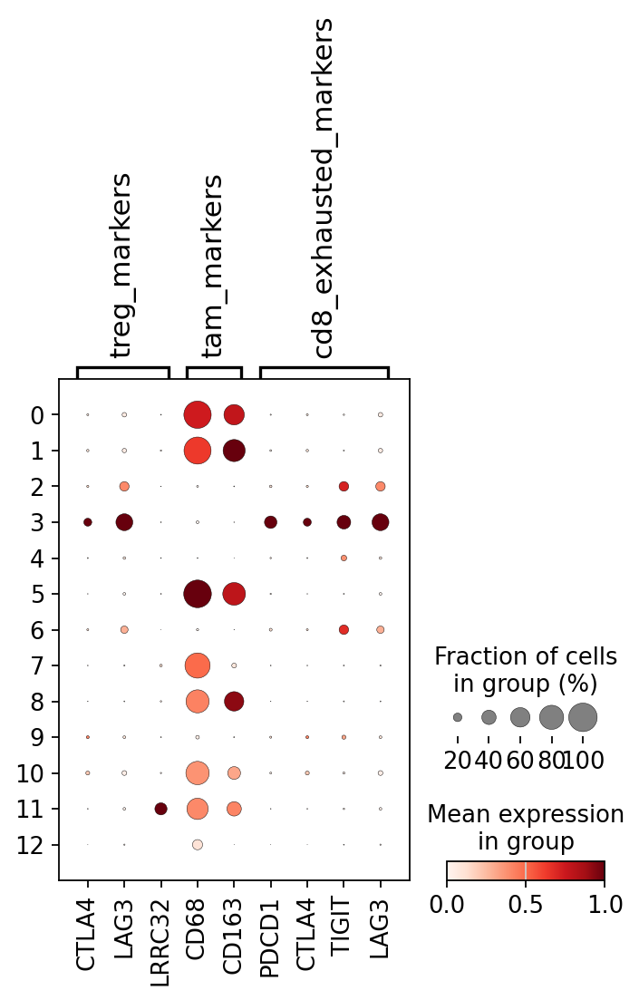

In [112]:
marker_genes = {
"treg_markers" : [ 'CTLA4',  'LAG3', 'LRRC32'],
"tam_markers" : ['CD68', 'CD163'],
"cd8_exhausted_markers" : ['PDCD1', 'CTLA4', 'TIGIT', 'LAG3']
}

sc.pl.dotplot(I0adata, marker_genes, groupby="leiden", standard_scale="var")

... storing 'cell_type' as categorical


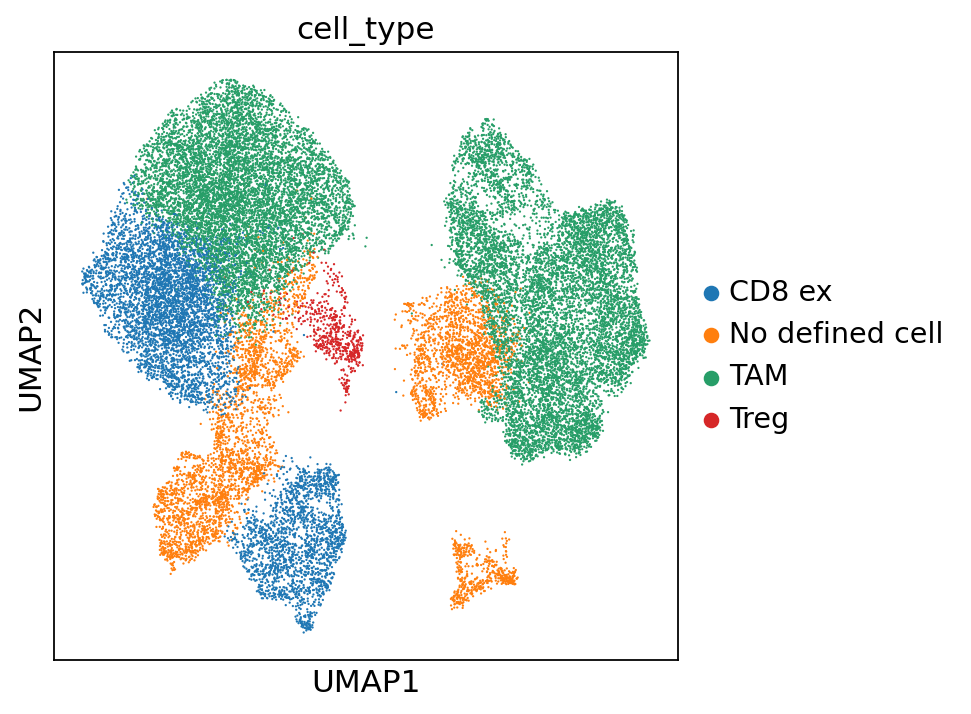

In [113]:
import scanpy as sc
import pandas as pd

def annotate_clusters(I0adata, cluster_col='leiden', annotation_map=None):
    """
    클러스터링된 adata 객체의 클러스터에 셀 타입을 주석하는 함수.

    Parameters:
    adata (AnnData): UMAP 및 클러스터링이 완료된 AnnData 객체.
    cluster_col (str): adata.obs에서 클러스터링 열 이름. 기본값은 'leiden'.
    annotation_map (dict): 클러스터 ID와 셀 타입 간 매핑 딕셔너리. 예: {'0': 'epithelial', '1': 'myeloid', ...}

    Returns:
    AnnData: 셀 타입이 adata.obs에 주석된 AnnData 객체.
    """
    if annotation_map is None:
        raise ValueError("annotation_map을 제공해야 합니다.")

    # 클러스터 ID를 셀 타입으로 매핑하여 새로운 열 추가
    I0adata.obs['cell_type'] = I0adata.obs[cluster_col].map(annotation_map)

    # 매핑이 안 된 클러스터가 있는지 확인
    unmapped_clusters = I0adata.obs[I0adata.obs['cell_type'].isnull()][cluster_col].unique()
    if len(unmapped_clusters) > 0:
        print(f"다음 클러스터 ID는 매핑되지 않았습니다: {unmapped_clusters}")

    return I0adata

# 예시 사용법
annotation_map = { 
    '0': 'TAM', 
    '1': 'CD8 ex', 
    '2': 'TAM', 
    '3': 'TAM', 
    '4': 'TAM', 
    '5': 'TAM', 
    '6': 'TAM' ,
    '7': 'CD8 ex',
    '8': 'No defined cell',
    '9': 'No defined cell',
    '10': 'No defined cell',
    '11': 'Treg',
    '12': 'No defined cell'
}

# 클러스터링된 adata 객체에 셀 타입을 주석
I0adata = annotate_clusters(I0adata, cluster_col='leiden', annotation_map=annotation_map)

# UMAP 시각화 시 셀 타입 표시
sc.pl.umap(I0adata, color='cell_type')


In [114]:
A = I0adata.obs['cell_type'] == 'No defined cell'
A.sum()

4920

In [115]:
# 'final_labels' 열을 문자열로 변환
Iadata.obs['final_labels'] = Iadata.obs['final_labels'].astype(str)
common_indices = Iadata.obs.index.intersection(I0adata.obs.index)
# 공통된 인덱스를 기준으로 'final_labels'에 cell_type 값 넣기
Iadata.obs.loc[common_indices, 'final_labels'] = I0adata.obs.loc[common_indices, 'cell_type']


In [116]:
Iadata[Iadata.obs['final_labels'] == 'No defined cell'].obs.shape

(4920, 29)

In [117]:
#Immuno supressed cell annotation complete
Iadata.write('/home/Data_Drive_8TB_3/kykim/ccRCC/Immunocell_adata.h5ad')


... storing 'final_labels' as categorical


In [118]:
Eadata.obs['leiden'] = "ccRCC" + Eadata.obs['leiden'].astype(str)

Eadata.obs['leiden'].unique()

array(['ccRCCccRCC0', 'ccRCCccRCC2', 'ccRCCccRCC4', 'ccRCCccRCC5',
       'ccRCCccRCC7', 'ccRCCccRCC3', 'ccRCCccRCC6', 'ccRCCccRCC1'],
      dtype=object)

In [169]:
Eadata.write('/home/Data_Drive_8TB_3/kykim/ccRCC/Epithelial_adata.h5ad')


... storing 'leiden' as categorical


In [2]:
import scanpy as sc
adata = sc.read_h5ad('/home/Data_Drive_8TB_3/kykim/ccRCC/Immunocell_adata.h5ad')
print(adata.shape)  # adata.shape는 튜플 형태로 출력됩니다.

(51848, 2126)


In [6]:
adata.obs['final_labels'] == 'E

final_labels
TAM                  16597
T cells              15795
CD8 ex                6538
ILC                   6181
No defined cell       4920
Macrophages           1077
Treg                   555
Endothelial cells       89
Monocytes               75
B cells                 11
Mast cells               5
Plasma cells             4
DC                       1
Name: count, dtype: int64

In [7]:
ccRCC2.write('/home/Data_Drive_8TB_3/kykim/ccRCC/ccRCC2_object.h5ad')


NameError: name 'ccRCC2' is not defined